In [1]:
!pip install -U pandas-profiling
!pip install pycaret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Импорт библиотек

In [2]:
import pandas as pd
import numpy as np

In [3]:
import pandas_profiling
from pycaret.classification import *

from pycaret.utils import enable_colab  
enable_colab()

Colab mode enabled.


In [40]:
from sklearn.model_selection import train_test_split, cross_val_score

from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, RandomForestClassifier
from xgboost import XGBClassifier

from sklearn.metrics import accuracy_score, mean_squared_error, make_scorer, classification_report, confusion_matrix, ConfusionMatrixDisplay

In [5]:
from scikitplot.metrics import plot_roc

In [6]:
import shap

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

import seaborn as sns

from mpl_toolkits.mplot3d import Axes3D
from ipywidgets import interact
from IPython.display import Image

%matplotlib inline

In [7]:
import random
random.seed(10)

# Загрузка данных

Мы будем работать с [данными клиентов банка](https://archive.ics.uci.edu/ml/machine-learning-databases/00573/) (задача кредитного скоринга).

Значение признаков:
<ul>
<li><strong>status</strong>: счёт в банке </li>

    (1 : no checking account;
     2 : < 0 DM;
     3 : < 200 DM;
     4 : >= 200 DM)
<br>
<li><strong>duration</strong>: целевой срок кредита </li>
<br>
<li><strong>credit_history</strong>: рейтинг по кредитной истории </li>

    (0 : delay in paying off in the past;
     1 : critical account/other credits elsewhere;
     2 : no credits taken/all credits paid back duly;
     3 : existing credits paid back duly till now;
     4 : all credits at this bank paid back duly)
<br>
<li><strong>purpose</strong>: цель кредита </li>

    (0 : others;
     1 : car (new);
     2 : car (used);
     3 : furniture/equipment;
     4 : radio/television;
     5 : domestic appliances;
     6 : repairs;
     7 : education;
     8 : vacation;
     9 : retraining;
     10 : business)
<br>
<li><strong>amount</strong>: целевая сумма кредита </li>
<br>
<li><strong>savings</strong>: сберегательный счет </li>

    (1 : unknown/no savings account;
     2 : ... <  100 DM;
     3 : 100 <= ... <  500 DM;
     4 : 500 <= ... < 1000 DM;
     5 : ... >= 1000 DM)
<br>
<li><strong>employment_duration</strong>: срок работы на текущей позиции </li>

    (1 : unemployed;
     2 : < 1 yr;
     3 : 1 <= ... < 4 yrs;
     4 : 4 <= ... < 7 yrs;
     5 : >= 7 yrs)
<br>
<li><strong>installment_rate</strong>: расчётная ставка </li>

    (1 : >= 35;
     2 : 25 <= ... < 35;
     3 : 20 <= ... < 25;
     4 : < 20)
<br>
<li><strong>personal_status_sex</strong>: пол и семейное положение </li>

    (1 : male : divorced/separated;
     2 : female : non-single or male : single;
     3 : male : married/widowed;
     4 : female : single)
<br>
<li><strong>other_debtors</strong>: созаёмщики/поручители </li>

    (1 : none;
     2 : co-applicant;
     3 : guarantor)
<br>
<li><strong>present_residence</strong>:  сколько лет резидент </li>

    (1 : < 1 yr;
     2 : 1 <= ... < 4 yrs;
     3 : 4 <= ... < 7 yrs;
     4 : >= 7 yrs)
<br>
<li><strong>property</strong>: собственность </li>

    (1 : unknown / no property;
     2 : car or other;
     3 : building soc. savings agr./life insurance;
     4 : real estate)
<br>
<li><strong>age</strong>: возраст </li>
<br>
<li><strong>other_installment_plans</strong>: другие рассматриваемые способы кредитования </li>

    (1 : bank;
     2 : stores;
     3 : none)
<br>
<li><strong>housing_rent</strong>: статус жилья </li>

    (1 : for free;
     2 : rent;
     3 : own)
<br>
<li><strong>number_credits</strong>: число взятых кредитов </li>

    (1 : 1;
     2 : 2-3;
     3 : 4-5;
     4 : >= 6)
<br>
<li><strong>job</strong>: работа </li>

    (1 : unemployed/unskilled - non-resident;
     2 : unskilled - resident;
     3 : skilled employee/official;
     4 : manager/self-empl./highly qualif. employee)
<br>
<li><strong>people_liable</strong>: есть ли поручители </li>

    (1 : 3 or more;
     2 : 0 to 2)
<br>
<li><strong>telephone</strong>: указан ли в заявке номер телефона </li>

    (1 : no;
     2 : yes)
<br>
<li><strong>foreign_worker</strong>: иностранный гражданин </li>

    (1 : yes;
     2 : no)
<br>
<li><strong>credit_risk</strong>: результат по заявке </li>

    (0 : bad;
     1 : good)
</ul>
Требуется решить задачу предсказания значения в последнем столбце, то есть задачу бинарной классификации.


In [8]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [9]:
dataset = pd.read_csv('/content/drive/My Drive/SouthGermanCredit.asc.csv', sep=' ')
dataset

,laufkont,laufzeit,moral,verw,hoehe,sparkont,beszeit,rate,famges,buerge,wohnzeit,verm,alter,weitkred,wohn,bishkred,beruf,pers,telef,gastarb,kredit
0,1,18,4,2,1049,1,2,4,2,1,4,2,21,3,1,1,3,2,1,2,1
1,1,9,4,0,2799,1,3,2,3,1,2,1,36,3,1,2,3,1,1,2,1
2,2,12,2,9,841,2,4,2,2,1,4,1,23,3,1,1,2,2,1,2,1
3,1,12,4,0,2122,1,3,3,3,1,2,1,39,3,1,2,2,1,1,1,1
4,1,12,4,0,2171,1,3,4,3,1,4,2,38,1,2,2,2,2,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1,24,2,3,1987,1,3,2,3,1,4,1,21,3,1,1,2,1,1,2,0
996,1,24,2,0,2303,1,5,4,3,2,1,1,45,3,2,1,3,2,1,2,0
997,4,21,4,0,12680,5,5,4,3,1,4,4,30,3,3,1,4,2,2,2,0
998,2,12,2,3,6468,5,1,2,3,1,1,4,52,3,2,1,4,2,2,2,0


# Переименование колонок

на английский вариант в соответствии с codetable.txt

In [10]:
dataset.columns

Index(['laufkont', 'laufzeit', 'moral', 'verw', 'hoehe', 'sparkont', 'beszeit',
       'rate', 'famges', 'buerge', 'wohnzeit', 'verm', 'alter', 'weitkred',
       'wohn', 'bishkred', 'beruf', 'pers', 'telef', 'gastarb', 'kredit'],
      dtype='object')

In [11]:
df = dataset.copy()

In [12]:
dict_col_names = ['status', 'duration', 'credit_history', 'purpose', 'amount', 'savings', 'employment_duration', 
                  'installment_rate', 'personal_status_sex', 'other_debtors', 'present_residence', 'property', 
                  'age', 'other_installment_plans', 'housing_rent', 'number_credits', 'job', 'people_liable', 
                  'telephone', 'foreign_worker', 'credit_risk']

In [13]:
df.columns = dict_col_names

In [14]:
df.head()

,status,duration,credit_history,purpose,amount,savings,employment_duration,installment_rate,personal_status_sex,other_debtors,present_residence,property,age,other_installment_plans,housing_rent,number_credits,job,people_liable,telephone,foreign_worker,credit_risk
0,1,18,4,2,1049,1,2,4,2,1,4,2,21,3,1,1,3,2,1,2,1
1,1,9,4,0,2799,1,3,2,3,1,2,1,36,3,1,2,3,1,1,2,1
2,2,12,2,9,841,2,4,2,2,1,4,1,23,3,1,1,2,2,1,2,1
3,1,12,4,0,2122,1,3,3,3,1,2,1,39,3,1,2,2,1,1,1,1
4,1,12,4,0,2171,1,3,4,3,1,4,2,38,1,2,2,2,2,1,1,1


# Проверка атрибутов датасета

In [15]:
df.index

RangeIndex(start=0, stop=1000, step=1)

Индексы проставлены <i>автоматически</i> от 0 до 1000 <i>с шагом</i> 1.

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 21 columns):
 #   Column                   Non-Null Count  Dtype
---  ------                   --------------  -----
 0   status                   1000 non-null   int64
 1   duration                 1000 non-null   int64
 2   credit_history           1000 non-null   int64
 3   purpose                  1000 non-null   int64
 4   amount                   1000 non-null   int64
 5   savings                  1000 non-null   int64
 6   employment_duration      1000 non-null   int64
 7   installment_rate         1000 non-null   int64
 8   personal_status_sex      1000 non-null   int64
 9   other_debtors            1000 non-null   int64
 10  present_residence        1000 non-null   int64
 11  property                 1000 non-null   int64
 12  age                      1000 non-null   int64
 13  other_installment_plans  1000 non-null   int64
 14  housing_rent             1000 non-null   int64
 15  numbe

Значения во всех колонках <i>заполнены</i> и <i>целочисленные</i>. <strong>Помним, что в основном это номера категорий!</strong>
<br>кроме: <i>duration</i>, <i>amount</i>, <i>age</i>

In [17]:
df[['duration', 'amount', 'age']].describe().T

,count,mean,std,min,25%,50%,75%,max
duration,1000.0,20.903,12.058814,4.0,12.0,18.0,24.00,72.0
amount,1000.0,3271.248,2822.751760,250.0,1365.5,2319.5,3972.25,18424.0
age,1000.0,35.542,11.352670,19.0,27.0,33.0,42.00,75.0


# Проверка целевой переменной

In [18]:
df['credit_risk'].value_counts()

1    700
0    300
Name: credit_risk, dtype: int64

Как можно видеть, в целевой переменной <strong>преобладают одобренные кредиты</strong> (70:30).
<br><br>Не самое лучшее соотношение (<i>50:50</i>), но и не худшее (например, <i>90:10</i>) в предположении, что заявки на кредит чаще получают одобрение, пусть и под высокие ставки.

# Подготовка категориальных переменных

У нам есть <i>двойная</i> категориальная переменная: <strong>personal_status_sex</strong>.
<br>В идеале её стоило бы <strong>разбить на 2</strong>: <i>пол</i> и <i>семейное положение</i>.
<br><br>Однако категория 2 не даёт это сделать: (female : non-single) or (male : single).

У ряда переменных категории начинаются <strong>с 0</strong>, у другой - <strong>с 1</strong>.
<br><strong>Унифицируем кодировку</strong> всех категориальных переменных.

In [19]:
def change_category(value):
    value -= 1
    return value

In [20]:
for col in df.loc[:,~df.columns.isin(['duration', 'amount', 'age'])].columns:
    if df[col].min() != 0:
        df[col] = df[col].apply(change_category)

In [21]:
df.loc[:,~df.columns.isin(['duration', 'amount', 'age'])].describe().T

,count,mean,std,min,25%,50%,75%,max
status,1000.0,1.577,1.257638,0.0,0.0,1.0,3.0,3.0
credit_history,1000.0,2.545,1.083120,0.0,2.0,2.0,4.0,4.0
purpose,1000.0,2.828,2.744439,0.0,1.0,2.0,3.0,10.0
savings,1000.0,1.105,1.580023,0.0,0.0,0.0,2.0,4.0
employment_duration,1000.0,2.384,1.208306,0.0,2.0,2.0,4.0,4.0
installment_rate,1000.0,1.973,1.118715,0.0,1.0,2.0,3.0,3.0
personal_status_sex,1000.0,1.682,0.708080,0.0,1.0,2.0,2.0,3.0
other_debtors,1000.0,0.145,0.477706,0.0,0.0,0.0,0.0,2.0
present_residence,1000.0,1.845,1.103718,0.0,1.0,2.0,3.0,3.0
property,1000.0,1.358,1.050209,0.0,0.0,1.0,2.0,3.0


# Быстрый просмотр свойств значений

In [22]:
profile_report = df.profile_report()
profile_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Колонку <strong>"purpose"</strong> библиотека <i>pandas</i> посчитала как <strong>целое</strong> число ввиду преобладания нулевой категории (23.4%).
<br><strong>Может сказаться на результатах при построении моделей!</strong> Запомним и будем внимательны.

Также выявлена высокая корреляция между следующими колонками:
<ul>
<li><strong>duration</strong> - <strong>amount</strong></li>
        срок кредита и сумма кредита - большую сумму хотят взять на более длительный срок, но не всегда
<br><br>
<li><strong>credit_history</strong> - <strong>number_credits</strong></li>
        рейтинг по кредитной истории и количество кредитов - чем больше человек брал кредитов, тем чётче прослеживается рейтинг
<br><br>
<li><strong>housing_rent</strong> - <strong>property</strong></li>
        статус жилья и собственность - отсутствие жилья не всегда говорит об отсутствии авто или наличии соц.страховки
<br>        это всё может быть просто не указано в заявке
<br><br>
<li><strong>status</strong> - <strong>credit_risk</strong></li>
        счёт в банке и результат по заявке - вряд ли человеку выдадут кредит в банке, если он банкрот
<br><br>
<li><strong>employment_duration</strong> - <strong>age</strong></li>
        срок работы на текущей позиции и возраст - молодой человек имеет небольшой стаж, старший - может часто увольняться
<br><br>
<li><strong>job</strong> - <strong>telephone</strong></li>
        наличие работы и указан ли телефон - в основном указывают рабочий телефон
</ul>

Представленные выше корреляции <strong>не являются дублирующими</strong>, но возьмём их на заметку!

# Быстрое сравнение моделей и выбор лучших

Сначала проверим, какие <strong>5 моделей</strong> будут лучшими <strong>при стандартном пороге вероятности</strong> для бинарной классификации, равном 0.5:

In [23]:
clf0 = setup(data = df, target = 'credit_risk')
best_model1 = compare_models(sort = 'F1', probability_threshold = 0.5, n_select = 5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.7554,0.7697,0.8980,0.7852,0.8370,0.3526,0.3693,0.174
rf,Random Forest Classifier,0.7426,0.7748,0.9265,0.7603,0.8344,0.2768,0.3084,0.212
lr,Logistic Regression,0.7511,0.7770,0.8673,0.7967,0.8301,0.3668,0.3726,0.234
ridge,Ridge Classifier,0.7440,0.0000,0.8816,0.7820,0.8279,0.3311,0.3464,0.022
et,Extra Trees Classifier,0.7354,0.7572,0.9041,0.7638,0.8273,0.2757,0.2957,0.179
ada,Ada Boost Classifier,0.7440,0.7532,0.8735,0.7862,0.8261,0.3402,0.3562,0.118
lda,Linear Discriminant Analysis,0.7426,0.7688,0.8653,0.7888,0.8243,0.3430,0.3539,0.024
dummy,Dummy Classifier,0.7010,0.5000,1.0000,0.7010,0.8242,0.0000,0.0000,0.011
lightgbm,Light Gradient Boosting Machine,0.7354,0.7531,0.8612,0.7843,0.8193,0.3228,0.3355,0.141
nb,Naive Bayes,0.7297,0.7481,0.7939,0.8171,0.8036,0.3656,0.3704,0.015


INFO:logs:create_model_container: 14
INFO:logs:master_model_container: 14
INFO:logs:display_container: 2
INFO:logs:[CustomProbabilityThresholdClassifier(ccp_alpha=0.0,
                                     classifier=GradientBoostingClassifier(ccp_alpha=0.0,
                                                                           criterion='friedman_mse',
                                                                           init=None,
                                                                           learning_rate=0.1,
                                                                           loss='deviance',
                                                                           max_depth=3,
                                                                           max_features=None,
                                                                           max_leaf_nodes=None,
                                                                           min_impurity_dec

Так как у нас целевая переменная не оптимальна, проверим:
<br>какие <strong>5 моделей</strong> будут лучшими <strong>при пониженном пороге вероятности</strong>, равном 0.3:

In [24]:
clf1 = setup(data = df, target = 'credit_risk')
best_model2 = compare_models(sort = 'F1', probability_threshold = 0.3, n_select = 5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.7525,0.7873,0.9692,0.7506,0.8455,0.2685,0.3399,0.176
lr,Logistic Regression,0.7496,0.7754,0.9568,0.7527,0.8422,0.2730,0.3261,0.100
lda,Linear Discriminant Analysis,0.7496,0.7681,0.9426,0.7587,0.8404,0.2889,0.3262,0.025
rf,Random Forest Classifier,0.7196,0.7793,0.9918,0.7160,0.8316,0.1094,0.2186,0.214
lightgbm,Light Gradient Boosting Machine,0.7383,0.7727,0.9221,0.7571,0.8309,0.2727,0.3042,0.060
ridge,Ridge Classifier,0.7510,0.0000,0.8646,0.7980,0.8288,0.3708,0.3804,0.014
et,Extra Trees Classifier,0.7153,0.7504,0.9734,0.7187,0.8267,0.1191,0.1969,0.182
ada,Ada Boost Classifier,0.6981,0.7699,1.0000,0.6981,0.8222,0.0000,0.0000,0.117
dummy,Dummy Classifier,0.6981,0.5000,1.0000,0.6981,0.8222,0.0000,0.0000,0.012
knn,K Neighbors Classifier,0.6910,0.5562,0.9569,0.7055,0.8121,0.0420,0.0605,0.027


INFO:logs:create_model_container: 14
INFO:logs:master_model_container: 14
INFO:logs:display_container: 2
INFO:logs:[CustomProbabilityThresholdClassifier(ccp_alpha=0.0,
                                     classifier=GradientBoostingClassifier(ccp_alpha=0.0,
                                                                           criterion='friedman_mse',
                                                                           init=None,
                                                                           learning_rate=0.1,
                                                                           loss='deviance',
                                                                           max_depth=3,
                                                                           max_features=None,
                                                                           max_leaf_nodes=None,
                                                                           min_impurity_dec

И наконец, проверим, какие <strong>5 моделей</strong> будут лучшими <strong>при повышенном пороге вероятности</strong>, равном 0.7:

In [25]:
clf2 = setup(data = df, target = 'credit_risk')
best_model3 = compare_models(sort = 'F1', probability_threshold = 0.7, n_select = 5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ridge,Ridge Classifier,0.7655,0.0000,0.8946,0.7974,0.8428,0.3845,0.3974,0.017
dummy,Dummy Classifier,0.7053,0.5000,1.0000,0.7053,0.8272,0.0000,0.0000,0.013
lightgbm,Light Gradient Boosting Machine,0.7268,0.7826,0.7790,0.8242,0.8004,0.3676,0.3699,0.059
gbc,Gradient Boosting Classifier,0.7225,0.7711,0.7467,0.8443,0.7910,0.3810,0.3901,0.177
lda,Linear Discriminant Analysis,0.7225,0.7678,0.7425,0.8467,0.7900,0.3846,0.3936,0.025
dt,Decision Tree Classifier,0.6996,0.6378,0.7888,0.7883,0.7874,0.2726,0.2752,0.018
lr,Logistic Regression,0.7153,0.7753,0.7202,0.8543,0.7802,0.3833,0.3964,0.102
nb,Naive Bayes,0.6981,0.7245,0.7242,0.8265,0.7710,0.3327,0.3397,0.019
rf,Random Forest Classifier,0.6938,0.7847,0.6858,0.8514,0.7590,0.3525,0.3687,0.209
svm,SVM - Linear Kernel,0.6596,0.0000,0.8700,0.6434,0.7360,0.0229,0.0234,0.020


INFO:logs:create_model_container: 14
INFO:logs:master_model_container: 14
INFO:logs:display_container: 2
INFO:logs:[CustomProbabilityThresholdClassifier(alpha=1.0, class_weight=None,
                                     classifier=RidgeClassifier(alpha=1.0,
                                                                class_weight=None,
                                                                copy_X=True,
                                                                fit_intercept=True,
                                                                max_iter=None,
                                                                normalize=False,
                                                                random_state=8056,
                                                                solver='auto',
                                                                tol=0.001),
                                     copy_X=True, fit_intercept=True,
                              

<strong>Сравним</strong> полученные 3 ответа и <strong>оставим те</strong> модели, которые <strong>вошли во все три списка</strong>:

In [26]:
def name_model(my_list):
  new_list = []
  for item in my_list:
    new_list.append(type(item.classifier_))
  return new_list

In [27]:
result = list(set(name_model(best_model1)) & set(name_model(best_model2)) & set(name_model(best_model3)))
result

[sklearn.ensemble._gb.GradientBoostingClassifier]

Лучшей для всех вариаций оказалась модель <strong>GradientBoostingClassifier</strong> - модель градиентного бустинга.

Также отдельно выведем <strong>модели для 0.5</strong> и <strong>проверим 2 пересечения</strong>:

*   0.5 и 0.3
*   0.5 и 0.7

In [29]:
result1 = list(set(name_model(best_model1)) & set(name_model(best_model2)))
result1

[sklearn.linear_model._logistic.LogisticRegression,
 sklearn.ensemble._gb.GradientBoostingClassifier,
 sklearn.ensemble._forest.RandomForestClassifier]

In [30]:
result2 = list(set(name_model(best_model1)) & set(name_model(best_model3)))
result2

[sklearn.ensemble._gb.GradientBoostingClassifier,
 sklearn.linear_model._ridge.RidgeClassifier]

Единственная модель <strong>ExtraTreesClassifier</strong> - модель чрезвычайно рандомизированных деревьев - не вошла ни в одно из пересечений.
<br>Она относится к классу ансамблевых методов, как и вошедшая во все пересечения модель <strong>GradientBoostingClassifier</strong>.

Таким образом, <i>лучше всего</i> себя показали следующие <i>4 модели</i>:


*   <strong>GradientBoostingClassifier</strong>
    <br>модель градиентного бустинга<br>

*   <strong>LogisticRegression</strong>
    <br>модель логистической регрессии<br>

*   <strong>RandomForestClassifier</strong>
    <br>модель случайного леса<br>

*   <strong>RidgeClassifier</strong>
    <br>модель опорных векторов наименьших квадратов с линейным ядром<br>

Их мы и будем тестировать на данных.

# Подготовка перед построением моделей

Сначала разделим датасет на <strong>независимые</strong> и <strong>зависимую переменные</strong>:

In [32]:
X = df.drop(['credit_risk'],axis=1)
X.columns

Index(['status', 'duration', 'credit_history', 'purpose', 'amount', 'savings',
       'employment_duration', 'installment_rate', 'personal_status_sex',
       'other_debtors', 'present_residence', 'property', 'age',
       'other_installment_plans', 'housing_rent', 'number_credits', 'job',
       'people_liable', 'telephone', 'foreign_worker'],
      dtype='object')

In [33]:
y = df['credit_risk']
y.head()

0    1
1    1
2    1
3    1
4    1
Name: credit_risk, dtype: int64

Теперь разделим выборку на <strong>обучающую</strong> и <strong>тестовую</strong>:

In [34]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)
print(X_train.shape, X_test.shape)

(750, 20) (250, 20)


Выборка разделилась на обучающую и тестовую в стандартном соотношении <strong>75%:25%</strong> соответственно.

Проверим, насколько равномерно распределилась наша целевая переменная.

In [35]:
counts = y_train.value_counts()
percent = y_train.value_counts(normalize=True) \
           .mul(100).round(2).astype(str) + '%'
pd.DataFrame({'counts': counts, 'per': percent})

,counts,per
1,533,71.07%
0,217,28.93%


In [36]:
counts = y_test.value_counts()
percent = y_test.value_counts(normalize=True) \
           .mul(100).round(2).astype(str) + '%'
pd.DataFrame({'counts': counts, 'per': percent})

,counts,per
1,167,66.8%
0,83,33.2%


In [37]:
train = (y_train.value_counts() / y.value_counts()) \
           .mul(100).round(2).astype(str) + '%'
test = (y_test.value_counts() / y.value_counts()) \
           .mul(100).round(2).astype(str) + '%'
pd.DataFrame({'train': train, 'test': test})

,train,test
1,76.14%,23.86%
0,72.33%,27.67%


Как мы видим, сами выборки разделились <strong>оптимально</strong> (близко к 75:25).
<br>И соотношение внутри целевой переменной <strong>осталось прежним</strong> (близко к 70:30).

# Предпроверка качества модели GradientBoosting

Прежде, чем перейти к построению моделей, <strong>сравним</strong> GradientBoosting с 2 распространёнными моделями по показателям качества :


*   <strong>AdaBoostClassifier</strong>
*   <strong>XGBClassifier</strong>

In [38]:
trees = [1] + list(range(100, 1000, 100))

ada_scoring = []
gbc_scoring = []
xgb_scoring = []

for tree in trees:
    ada = AdaBoostClassifier(n_estimators=tree)
    gbc = GradientBoostingClassifier(n_estimators=tree)
    xgb = XGBClassifier(n_estimators=tree)

    for item in ([ada_scoring, ada], [gbc_scoring, gbc], [xgb_scoring, xgb]):
      score = cross_val_score(item[1], X, y, scoring='roc_auc', cv=3)
      item[0].append(score)

ada_scoring = np.asmatrix(ada_scoring)
gbc_scoring = np.asmatrix(gbc_scoring)
xgb_scoring = np.asmatrix(xgb_scoring)

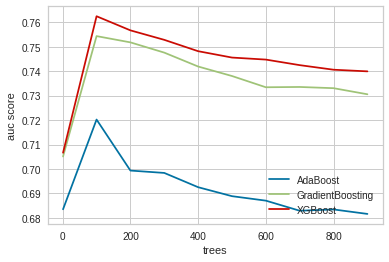

In [39]:
plt.plot(trees, ada_scoring.mean(axis=1), label='AdaBoost')
plt.plot(trees, gbc_scoring.mean(axis=1), label='GradientBoosting')
plt.plot(trees, xgb_scoring.mean(axis=1), label='XGBoost')
plt.grid(True)
plt.xlabel('trees')
plt.ylabel('auc score')
plt.legend(loc='lower right')

Как можно видеть, GradientBoosting немного уступает по качеству XGBoost.
<br>Но она гораздо лучше AdaBoost.

# Построение выбранных моделей

ccp_alpha=0.0, criterion='friedman_mse', init=None,
learning_rate=0.1, loss='deviance', max_depth=3,
max_features=None, max_leaf_nodes=None,
min_impurity_decrease=0.0, min_impurity_split=None,
min_samples_leaf=1, min_samples_split=2,
min_weight_fraction_leaf=0.0, n_estimators=100,
n_iter_no_change=None, presort='deprecated',
random_state=683, subsample=1.0, tol=0.0001,
validation_fraction=0.1, verbose=0,
warm_start=False


---

ccp_alpha=0.0, criterion='friedman_mse', init=None,
learning_rate=0.1, loss='deviance', max_depth=3,
max_features=None, max_leaf_nodes=None,
min_impurity_decrease=0.0, min_impurity_split=None,
min_samples_leaf=1, min_samples_split=2,
min_weight_fraction_leaf=0.0, n_estimators=100,
n_iter_no_change=None, presort='deprecated',
random_state=7176, subsample=1.0, tol=0.0001,
validation_fraction=0.1, verbose=0,
warm_start=False


---

ccp_alpha=0.0, criterion='friedman_mse', init=None,
learning_rate=0.1, loss='deviance', max_depth=3,
max_features=None, max_leaf_nodes=None,
min_impurity_decrease=0.0, min_impurity_split=None,
min_samples_leaf=1, min_samples_split=2,
min_weight_fraction_leaf=0.0, n_estimators=100,
n_iter_no_change=None, presort='deprecated',
random_state=8056, subsample=1.0, tol=0.0001,
validation_fraction=0.1, verbose=0,
warm_start=False

In [41]:
model_GB = GradientBoostingClassifier(
                                      ccp_alpha=0.0, # Параметр сложности, используемый для обрезки с минимальными затратами и сложностью. По умолчанию 0
                                      criterion='friedman_mse', # Функция измерения качества разделения
                                      init=None, # Объект оценки, используемый для вычисления начальных прогнозов. По умолчанию None
                                      learning_rate=0.1, # Доля образцов, используемых для установки отдельного основания Учащихся. Если меньше 1, это приводит к стохастическому градиенту
                                      loss='deviance', # Оптимизируемая функция потерь
                                      max_depth=3, # Максимальная глубина отдельных регрессионных оценок. По умолчанию 3
                                      max_features=None, # Количество функций, которые следует учитывать при поиске наилучшего разделения. По умолчанию None
                                      max_leaf_nodes=None, # Лучшие узлы определяются как относительное уменьшение примесей. По умолчанию None
                                      min_impurity_decrease=0.0, # Узел будет разделен, если <, >, = этому значению. По умолчанию 0
                                      min_impurity_split=None, # Узел будет разделен. По умолчанию None
                                      min_samples_leaf=1, # Минимальное количество образцов, необходимое для нахождения в листовом узле. По умолчанию 1
                                      min_samples_split=2, # Минимальное количество образцов, необходимое для разделения внутреннего узла. По умолчанию 2
                                      min_weight_fraction_leaf=0.0, # Минимальная взвешенная доля от общей суммы весов (из всех входные образцы), которые должны находиться на листовом узле. По умолчанию 0
                                      n_estimators=100, # Количество этапов повышения производительности. По умолчанию 100
                                      n_iter_no_change=None, # Для принятия решения о ранней остановке, когда оценка проверки не улучшается. По умолчанию None
                                      presort='deprecated',
                                      subsample=1.0, # Доля образцов, используемых для установки отдельного основания Учащихся. По умолчанию 1
                                      tol=0.0001, # Допуск к критериям остановки. По умолчанию 0.0001
                                      validation_fraction=0.1, # Доля обучающих данных, откладываемых в качестве набора проверки для ранняя остановка. По умолчанию 0.1
                                      verbose=0, # Для liblinear и lbfgs. По умолчанию 0
                                      warm_start=False, # Если True, повторно используйте решение предыдущего вызова, чтобы оно соответствовало значению инициализации, в противном случае, просто удалите предыдущее решение
                                      random_state=0 # Для перетасовки данных
)

C=1.0,
class_weight=None,
dual=False,
fit_intercept=True,
intercept_scaling=1,
l1_ratio=None,
max_iter=1000,
multi_class='auto',
n_jobs=None,
penalty='l2',                                                                   random_state=683,
solver='lbfgs',
tol=0.0001,
verbose=0,
warm_start=False


---

C=1.0,
class_weight=None,
dual=False,
fit_intercept=True,
intercept_scaling=1,
l1_ratio=None,
max_iter=1000,
multi_class='auto',
n_jobs=None,
penalty='l2',
random_state=393,
solver='lbfgs',
tol=0.0001,
verbose=0,
warm_start=False

In [42]:
model_Log = LogisticRegression(
                                C=1.0, # Обратная сила регуляризации
                                class_weight=None, # Веса, связанные с классами
                                dual=False, # dual=False, когда n_samples > n_features
                                fit_intercept=True, # должна ли константа быть добавлена
                                intercept_scaling=1, # Полезно только при 'liblinear' и self.fit_intercept == True. По умолчанию 1
                                l1_ratio=None, # Параметр смешивания Elastic-Net
                                max_iter=1000, # Максимальное количество итераций
                                multi_class='auto', # 'auto' выбирает 'ovr', если данные двоичны, или если solver='liblinear'. В противном случае - 'multinomial'.
                                n_jobs=None, # Количество ядер ЦП, используемых при распараллеливании по классам, если multi_class='ovr'
                                penalty='l2', # Норма штрафа. 'l2': добавить штрафной срок L2, и это выбор по умолчанию
                                solver='lbfgs', # Алгоритм для использования в задаче оптимизации. По умолчанию 'lbfgs'
                                tol=0.0001, # Допуск к критериям остановки. По умолчанию 0.0001
                                verbose=0, # Для liblinear и lbfgs. По умолчанию 0
                                warm_start=False, # Если True, повторно используйте решение предыдущего вызова, чтобы оно соответствовало значению инициализации, в противном случае, просто удалите предыдущее решение
                                random_state=0 # Для перетасовки данных
)

bootstrap=True, ccp_alpha=0.0, class_weight=None,
criterion='gini', max_depth=None, max_features='auto',
max_leaf_nodes=None, max_samples=None,
min_impurity_decrease=0.0, min_impurity_split=None,
min_samples_leaf=1, min_samples_split=2,
min_weight_fraction_leaf=0.0, n_estimators=100,
n_jobs=-1, oob_score=False, random_state=683, verbose=0,
warm_start=False

---
bootstrap=True, ccp_alpha=0.0, class_weight=None,
criterion='gini', max_depth=None, max_features='auto',
max_leaf_nodes=None, max_samples=None,
min_impurity_decrease=0.0, min_impurity_split=None,
min_samples_leaf=1, min_samples_split=2,
min_weight_fraction_leaf=0.0, n_estimators=100,
n_jobs=-1, oob_score=False, random_state=7176, verbose=0,
warm_start=False


In [43]:
model_RF = RandomForestClassifier(
                                  bootstrap=True, # Используются ли образцы начальной загрузки при построении деревьев. По умолчанию True
                                  ccp_alpha=0.0, # Параметр сложности, используемый для обрезки с минимальными затратами и сложностью. По умолчанию 0
                                  class_weight=None, # Веса, связанные с классами в форме. По умолчанию None
                                  criterion='gini', # Функция измерения качества разделения. По умолчанию gini
                                  max_depth=None, # Максимальная глубина отдельных регрессионных оценок. По умолчанию 3
                                  max_features='auto', # Количество функций, которые следует учитывать при поиске наилучшего разделения. По умолчанию None
                                  max_leaf_nodes=None, # Лучшие узлы определяются как относительное уменьшение примесей. По умолчанию None
                                  max_samples=None, # Максимальное количество образцов, необходимое для нахождения в листовом узле. По умолчанию 1
                                  min_impurity_decrease=0.0,# Узел будет разделен, если <, >, = этому значению. По умолчанию 0
                                  min_impurity_split=None,# Узел будет разделен. По умолчанию None
                                  min_samples_leaf=1, # Минимальное количество образцов, необходимое для нахождения в листовом узле. По умолчанию 1
                                  min_samples_split=2,# Минимальное количество образцов, необходимое для разделения внутреннего узла. По умолчанию 2
                                  min_weight_fraction_leaf=0.0, # Минимальная взвешенная доля от общей суммы весов (из всех входные образцы), которые должны находиться на листовом узле. По умолчанию 0
                                  n_estimators=100,# Количество этапов повышения производительности. По умолчанию 100
                                  n_jobs=-1, # Количество заданий, выполняемых параллельно. По умолчанию None (-1)
                                  oob_score=False, # Следует ли использовать выборки вне пакета для оценки оценки обобщения. По умолчанию False
                                  verbose=0, # Для liblinear и lbfgs. По умолчанию 0
                                  warm_start=False, # Если True, повторно используйте решение предыдущего вызова, чтобы оно соответствовало значению инициализации, в противном случае, просто удалите предыдущее решение
                                  random_state=0 # Для перетасовки данных
)

alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
max_iter=None, normalize=False, random_state=683, solver='auto',
tol=0.001

---
alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
max_iter=None, normalize=False, random_state=8056,
solver='auto', tol=0.001

In [44]:
model_RC = RidgeClassifier(
                           alpha=1.0, # Прочность регуляризации. По умолчанию 1
                           class_weight=None, # Веса, связанные с классами в форме. По умолчанию None
                           copy_X=True, # Если значение равно True, X будет скопирован; в противном случае он может быть перезаписан. По умолчанию True
                           fit_intercept=True, # Стоит ли вычислять перехват для данной модели. По умолчанию True
                           max_iter=None, # Максимальное количество итераций для сопряженного градиентного решателя. По умолчанию None
                           normalize=False, # Если значение равно True, регрессоры X будут нормализованы. По умолчанию False
                           solver='auto', # Решатель для использования в вычислительных процедурах. По умолчанию auto
                           tol=0.001, # Допуск к критериям остановки. По умолчанию 0.0001
                           random_state=0 # Для перетасовки данных
)

In [45]:
posfix = ['_GB', '_Log', '_RF', '_RC']
models = [model_GB, model_Log, model_RF, model_RC]

dict_models = dict(zip(posfix, models))
dict_models

{'_GB': GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                            learning_rate=0.1, loss='deviance', max_depth=3,
                            max_features=None, max_leaf_nodes=None,
                            min_impurity_decrease=0.0, min_impurity_split=None,
                            min_samples_leaf=1, min_samples_split=2,
                            min_weight_fraction_leaf=0.0, n_estimators=100,
                            n_iter_no_change=None, presort='deprecated',
                            random_state=0, subsample=1.0, tol=0.0001,
                            validation_fraction=0.1, verbose=0,
                            warm_start=False),
 '_Log': LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                    intercept_scaling=1, l1_ratio=None, max_iter=1000,
                    multi_class='auto', n_jobs=None, penalty='l2',
                    random_state=0, solver='lbfgs', tol=0.0001, 

In [68]:
def present_params(dict_models):
  back = shap.maskers.Independent(X_train)

  y_predict = dict()
  y_pred_prob = dict()
  cl_report = dict()
  model_score_train = dict()
  model_score_test = dict()
  mstr = dict()
  mste = dict()
  cm = dict()
  disp_cm = dict()
  explainer = dict()
  shap_values = dict()

  for pf, model in dict_models.items():
    model.fit(X_train, y_train)

    y_predict[pf] = model.predict(X_test)
    # y_pred_prob[pf] = model.predict_proba(X_test)

    cl_report[pf] = classification_report(y_test, y_predict[pf])

    model_score_train[pf] = model.score(X_train, y_train)
    model_score_test[pf] = model.score(X_test, y_test)

    mstr[pf] = round(model_score_train[pf] * 100, 2).astype(str) + '%'
    mste[pf] = round(model_score_test[pf] * 100, 2).astype(str) + '%'

    cm[pf] = confusion_matrix(y_test, y_predict[pf])
    disp_cm[pf] = ConfusionMatrixDisplay(confusion_matrix=cm[pf])
    
    explainer[pf] = shap.Explainer(model, back)
    
    shap_values[pf] = explainer[pf](X_train)
    shap_values[pf].display_data = X_train.values

  return {
      'y_predict': y_predict,
      'y_pred_prob': y_pred_prob,
      'cl_report': cl_report,
      'model_score_train': model_score_train,
      'model_score_test': model_score_test,
      'mstr': mstr,
      'mste': mste,
      'cm': cm,
      'disp_cm': disp_cm,
      'explainer': explainer,
      'shap_values': shap_values
      }

In [69]:
dict_params = present_params(dict_models)

 99%|===================| 1486/1500 [00:26<00:00]       

In [72]:
model_score_df = pd.DataFrame({'train': dict_params['mstr'], 'test': dict_params['mste']}, index = [pf for pf in dict_models.keys()])
print(model_score_df)

       train   test
_GB   91.33%  77.6%
_Log  77.07%  77.2%
_RF   100.0%  76.0%
_RC   77.33%  76.8%


Из таблицы оценки качества видно, что наилучшим образом повела себя модель <strong>_Log</strong>.

<br>Модель <strong>_RC</strong> проявила себя хуже, чем _Log.
<br>Модель <strong>_GB</strong> несмотря на высокий показатель явно переобучена.
<br>Модель <strong>_RF</strong> оказалась сильно переобученной.

In [73]:
for pf in dict_models.keys():
  print('\n' + pf + '\n' + dict_params['cl_report'][pf])


_GB
              precision    recall  f1-score   support

           0       0.74      0.51      0.60        83
           1       0.79      0.91      0.84       167

    accuracy                           0.78       250
   macro avg       0.76      0.71      0.72       250
weighted avg       0.77      0.78      0.76       250


_Log
              precision    recall  f1-score   support

           0       0.75      0.47      0.58        83
           1       0.78      0.92      0.84       167

    accuracy                           0.77       250
   macro avg       0.76      0.70      0.71       250
weighted avg       0.77      0.77      0.76       250


_RF
              precision    recall  f1-score   support

           0       0.76      0.41      0.53        83
           1       0.76      0.93      0.84       167

    accuracy                           0.76       250
   macro avg       0.76      0.67      0.68       250
weighted avg       0.76      0.76      0.74       250


_R

<Figure size 1152x288 with 0 Axes>

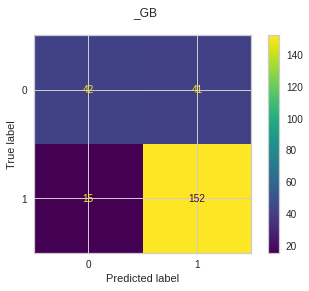

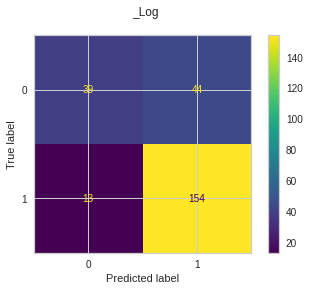

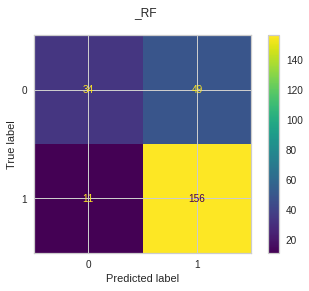

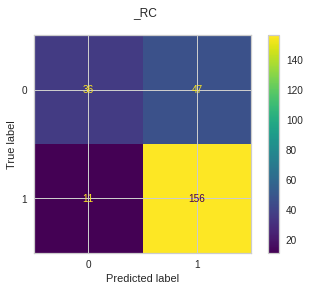

In [93]:
plt.figure(figsize=(16, 4))
for pf in dict_models.keys():
  try:
    dict_params['disp_cm'][pf].plot()
    plt.suptitle(pf)
  except:
    pass

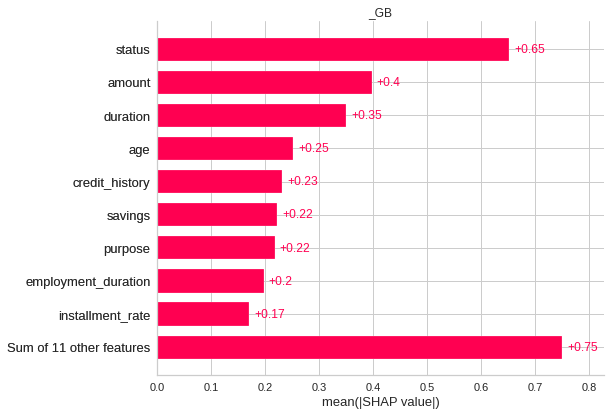

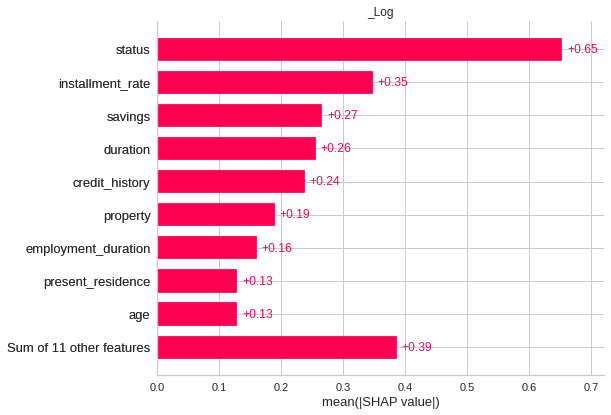

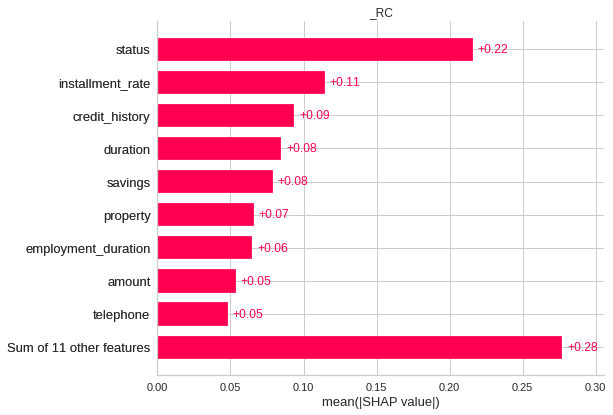

In [98]:
plt.figure(figsize=(16, 4))
for pf in dict_models.keys():
  try:
    plt.title(pf)    
    shap.plots.bar(dict_params['shap_values'][pf])
  except:
    pass
plt.show()

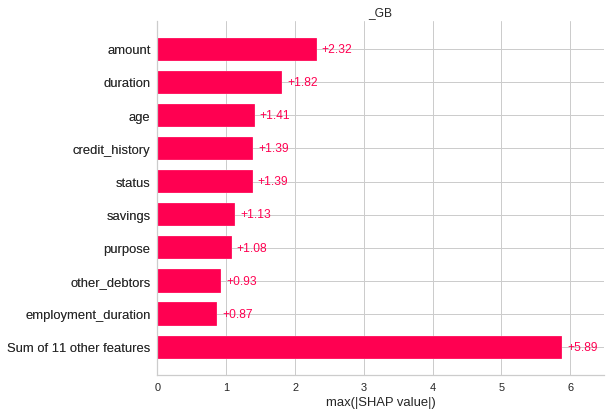

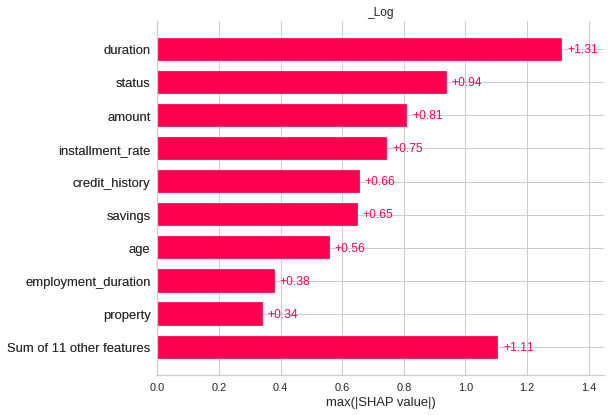

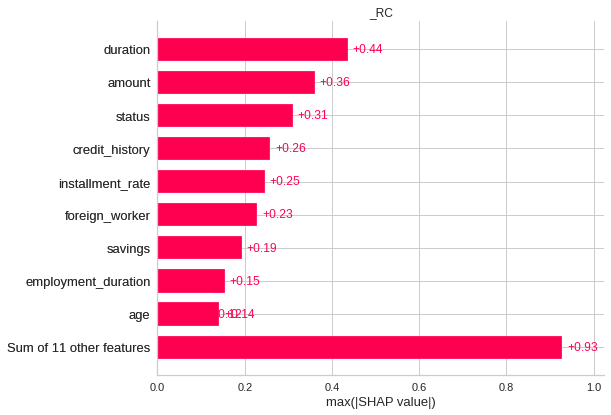

In [99]:
plt.figure(figsize=(16, 4))
for pf in dict_models.keys():
  try:
    plt.title(pf)
    shap.plots.bar(dict_params['shap_values'][pf].abs.max(0))
  except:
    pass
plt.show()

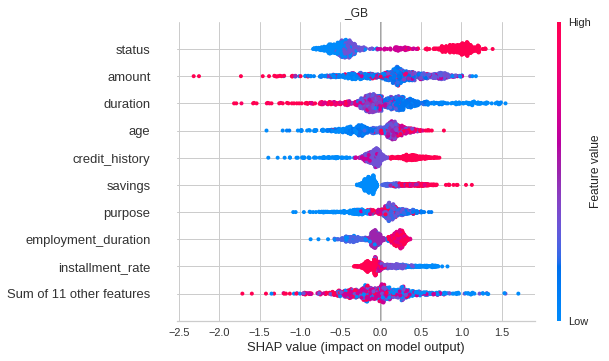

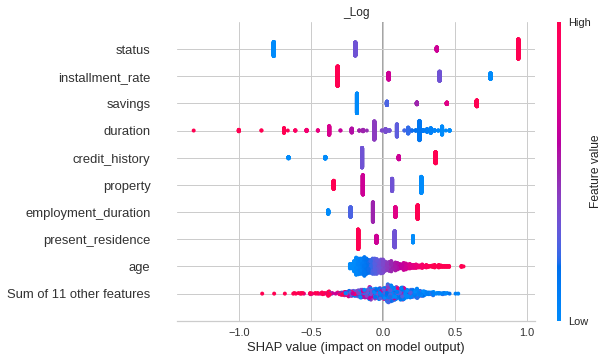

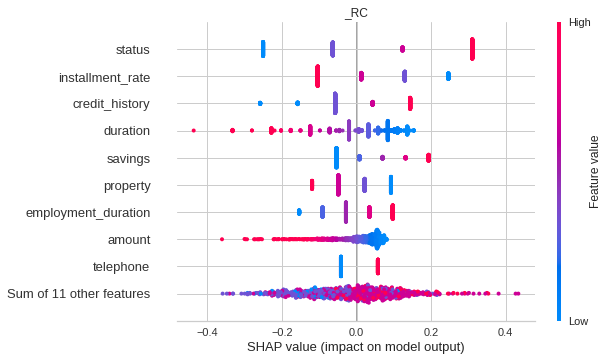

In [100]:
plt.figure(figsize=(16, 4))
for pf in dict_models.keys():
  try:
    plt.title(pf)
    shap.plots.beeswarm(dict_params['shap_values'][pf])
  except:
    pass
plt.show()

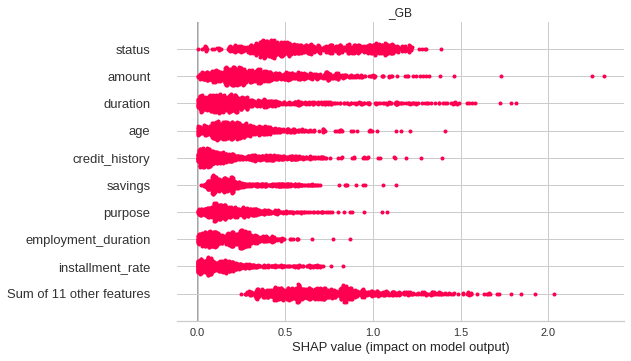

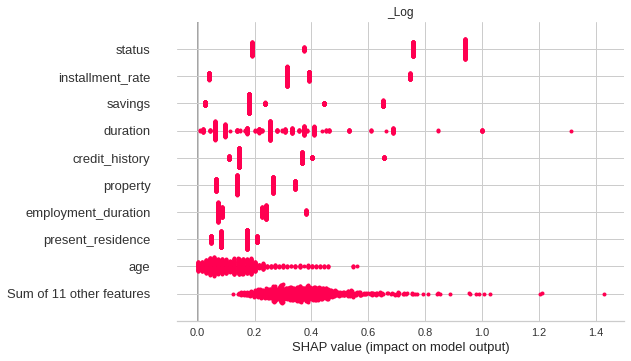

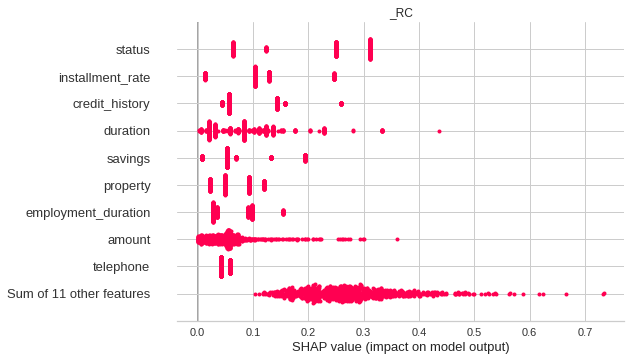

In [101]:
plt.figure(figsize=(16, 4))
for pf in dict_models.keys():
  try:
    plt.title(pf)
    shap.plots.beeswarm(dict_params['shap_values'][pf].abs, color='shap_red')
  except:
    pass
plt.show()

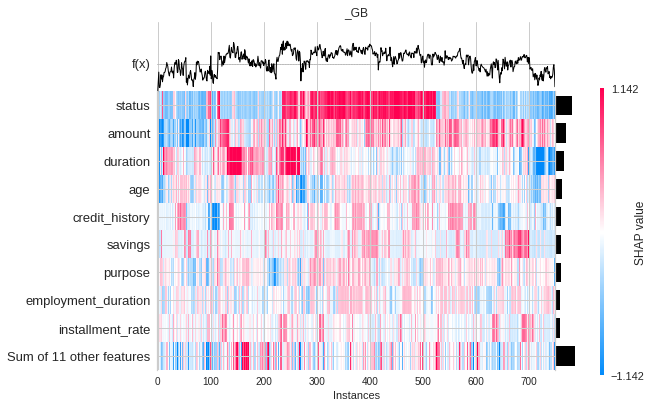

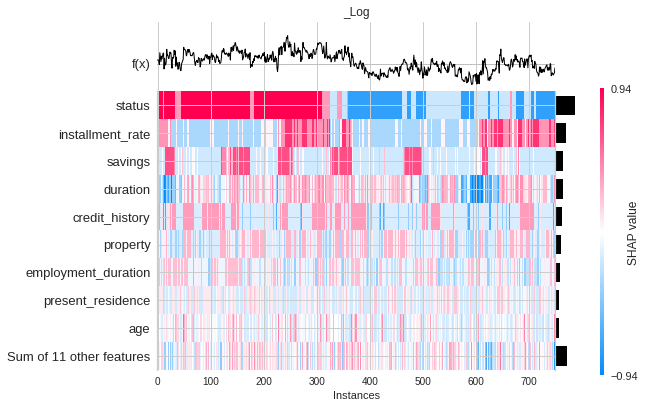

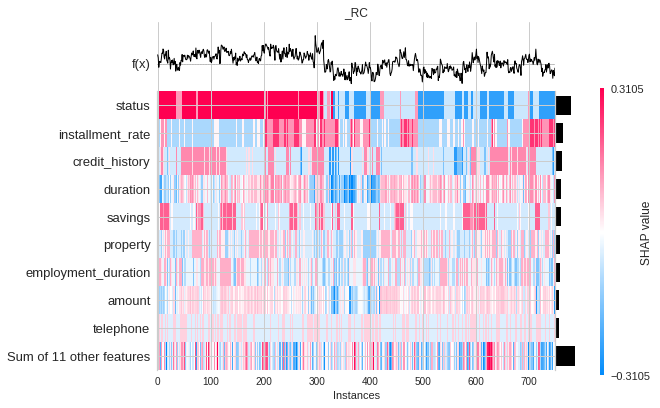

In [102]:
plt.figure(figsize=(16, 4))
for pf in dict_models.keys():
  try:
    plt.title(pf)
    shap.plots.heatmap(dict_params['shap_values'][pf])
  except:
    pass
plt.show()

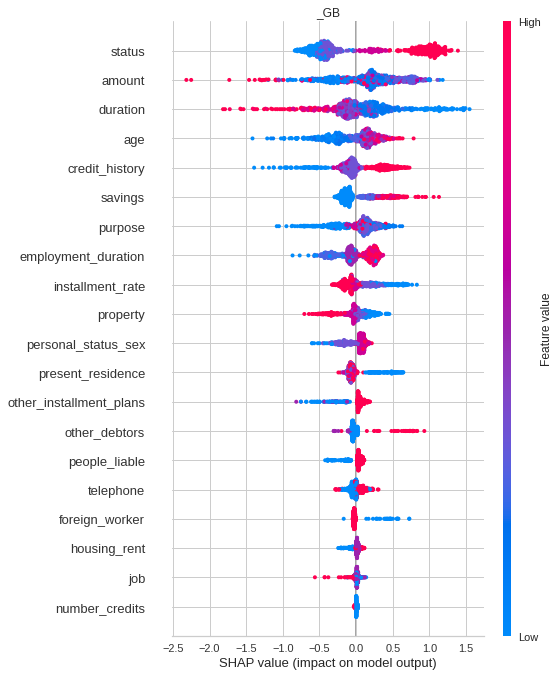

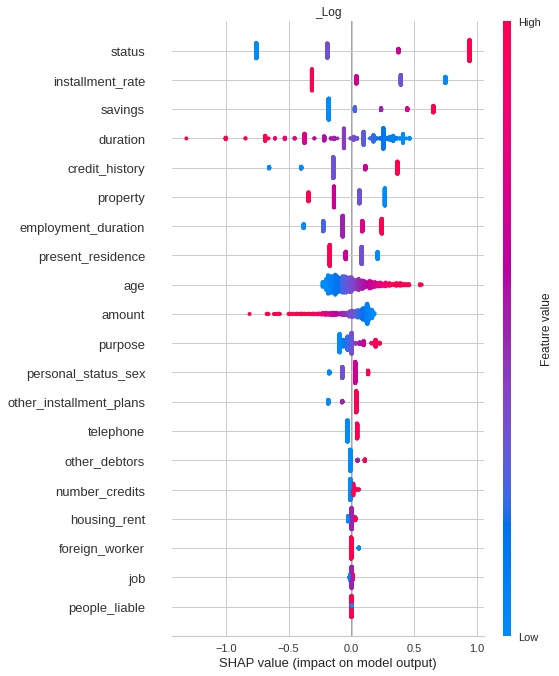

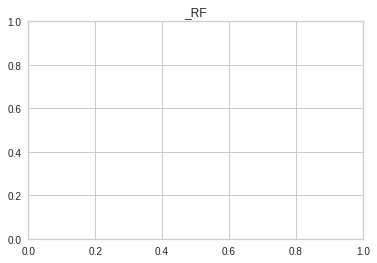

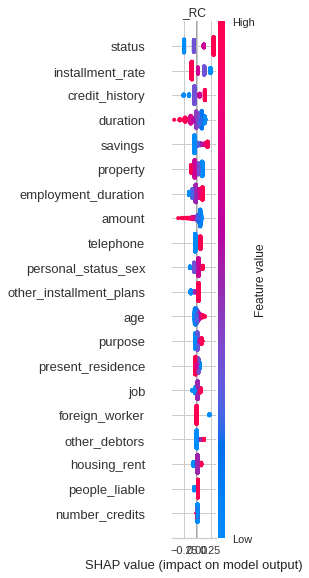

In [103]:
plt.figure(figsize=(16, 4))
for pf in dict_models.keys():
  try:
    plt.title(pf)
    shap.summary_plot(dict_params['shap_values'][pf], X_train)
  except:
    pass
plt.show()

Из графиков также видно, что наилучшим образом повела себя модель <strong>_Log</strong>.

Таким образом, в качестве лучше модели выбрана <strong>LogisticRegression</strong>.

In [105]:
import pickle

with open('/content/drive/My Drive/model.pkl','wb') as f:
    pickle.dump(model_Log,f)